In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline

### Load the Dataset

In [2]:
df_acdc = pd.read_csv(r'ACDC_radiomics.csv')
df_acdc.head()

,original_shape_Elongation_LV_ED,original_shape_Flatness_LV_ED,original_shape_LeastAxisLength_LV_ED,original_shape_MajorAxisLength_LV_ED,original_shape_Maximum2DDiameterColumn_LV_ED,original_shape_Maximum2DDiameterRow_LV_ED,original_shape_Maximum2DDiameterSlice_LV_ED,original_shape_Maximum3DDiameter_LV_ED,original_shape_MeshVolume_LV_ED,original_shape_MinorAxisLength_LV_ED,...,original_glszm_ZonePercentage_MYO_ES,original_glszm_ZoneVariance_MYO_ES,original_ngtdm_Busyness_MYO_ES,original_ngtdm_Coarseness_MYO_ES,original_ngtdm_Complexity_MYO_ES,original_ngtdm_Contrast_MYO_ES,original_ngtdm_Strength_MYO_ES,height,weight,class
0,0.560917,0.110560,6.592758,59.630582,45.398238,64.776539,64.007812,65.199693,5674.000000,33.447817,...,0.053567,40384.123570,19.552355,0.000993,36.034390,0.010496,0.091329,184,95,DCM
1,0.454960,0.088323,5.730218,64.877933,40.311289,64.140471,61.000000,67.446275,5015.833333,29.516875,...,0.028344,130808.332098,29.225756,0.000722,17.238110,0.006596,0.045024,160,70,DCM
2,0.541682,0.105418,6.711577,63.666027,48.041649,66.843100,59.135438,68.080834,7817.666667,34.486772,...,0.041404,92088.926893,20.732684,0.001106,13.916093,0.004455,0.069372,165,77,DCM
3,0.487949,0.105906,6.726159,63.510529,44.407207,66.370174,66.007575,66.475559,5629.166667,30.989912,...,0.150855,5232.431686,5.158496,0.000848,216.183657,0.025431,0.208797,159,46,DCM
4,0.442150,0.095225,7.186765,75.471150,68.066144,77.472576,50.487622,77.472576,8550.083333,33.369563,...,0.040613,91705.803093,18.086404,0.000710,41.886924,0.005266,0.123346,165,77,DCM


### Data Overview

#### Basic Information

In [3]:
df_acdc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 645 entries, original_shape_Elongation_LV_ED to class
dtypes: float64(601), int64(43), object(1)
memory usage: 504.0+ KB


Now we know that the data is comprised of 100 rows and 645 columns
we can proceed by checking if there are any null values in the dataset

In [4]:
null_counts = df_acdc.isnull().sum()
columns_with_nulls = null_counts[null_counts > 0]
len(columns_with_nulls)

0

Now that we know no null values are present we can start by looking at the class distribution

In [5]:
print(df_acdc['class'].unique())

['DCM' 'HCM' 'MINF' 'NOR' 'RV']


NameError: name 'acdc' is not defined

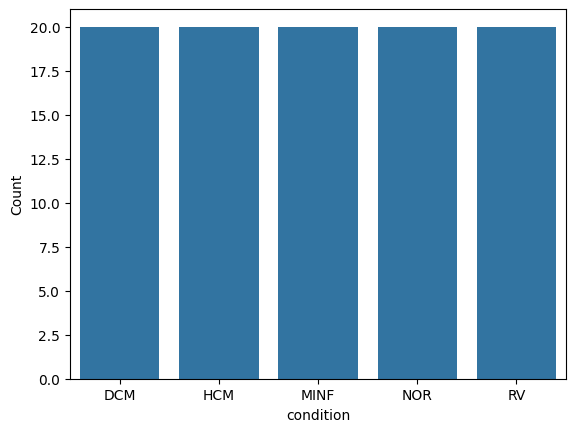

In [6]:
#classes bar plot (Balanced number of classes)
ax= sns.countplot(x=df_acdc['class'])
ax.set_xlabel("condition")
ax.set_ylabel("Count")
ax.set_xticklabels(df_acdc['class'].unique())
ax.set_title("ACDC")
plt.show()

Each row of the file represents a patient, with columns corresponding to radiomic features,
patient weight, height, and class labels. In total, you are provided with 642 radiomics of
three different categories (107 per structure per time-point):

* Shape
* First order, and
* Texture (GLCM, GLSZM, GLRLM, NGTDM, GLDM).

So we can group by each of the radiomic features.

In [7]:
# Extract FeatureNames by splitting the column names
feature_names = df_acdc.columns.str.split('_').str[2].unique()

# Print all unique feature names
print("Unique Feature Names:")
print(feature_names)

Unique Feature Names:
Index([                    'Elongation',                       'Flatness',
                      'LeastAxisLength',                'MajorAxisLength',
              'Maximum2DDiameterColumn',           'Maximum2DDiameterRow',
               'Maximum2DDiameterSlice',              'Maximum3DDiameter',
                           'MeshVolume',                'MinorAxisLength',
       ...
       'SmallAreaHighGrayLevelEmphasis',  'SmallAreaLowGrayLevelEmphasis',
                          'ZoneEntropy',                 'ZonePercentage',
                         'ZoneVariance',                       'Busyness',
                           'Coarseness',                     'Complexity',
                             'Strength',                              nan],
      dtype='object', length=102)


We can check the columns in each group as well

In [8]:
features = ['shape', 'firstorder', 'glcm', 'glszm', 'glrlm', 'ngtdm', 'gldm']

feature_dfs = {}
col_sum = 0
for feature in features:
    cols = [col for col in df_acdc.columns if col.startswith(f"original_{feature}_")]
    print(f"{feature} : {df_acdc[cols].shape[1]}")
    col_sum += df_acdc[cols].shape[1]
    feature_dfs[feature] = df_acdc[cols] #create a dictionary containing the feature dfs

print(f"Total : {col_sum}")


shape : 84
firstorder : 108
glcm : 144
glszm : 96
glrlm : 96
ngtdm : 30
gldm : 84
Total : 642


We define a function that overlaps the histograms for a feature in ED and ES.

In [9]:
def compare_hists(ed, es, title): 
    # Get common columns between ED and ES
    common_cols = ed.columns
    n_cols = len(common_cols)
    n_rows = int(np.ceil(n_cols / 3))  # 3 per row for better width
    
    plt.figure(figsize=(18, n_rows * 4))
    
    for i, col in enumerate(common_cols):
        plt.subplot(n_rows, 3, i + 1)
    
        col_es = col.split('ED')[0]+'ES'
        
        plt.hist(ed[col], bins=20, alpha=0.6, label='ED', color='skyblue', edgecolor='black')
        plt.hist(es[col_es], bins=20, alpha=0.6, label='ES', color='salmon', edgecolor='black')
        
        plt.title(col.split('_')[2], fontsize=10)
        plt.xlabel('Value')
        plt.ylabel('Count')
        plt.legend()
    
    plt.suptitle(f"{title}: ED vs ES", fontsize=18)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

Now we can use the feature list to split the dataframe into smaller dataframes for each feature and time point.
This way we can see if the data distribution differs between ED and ES. 

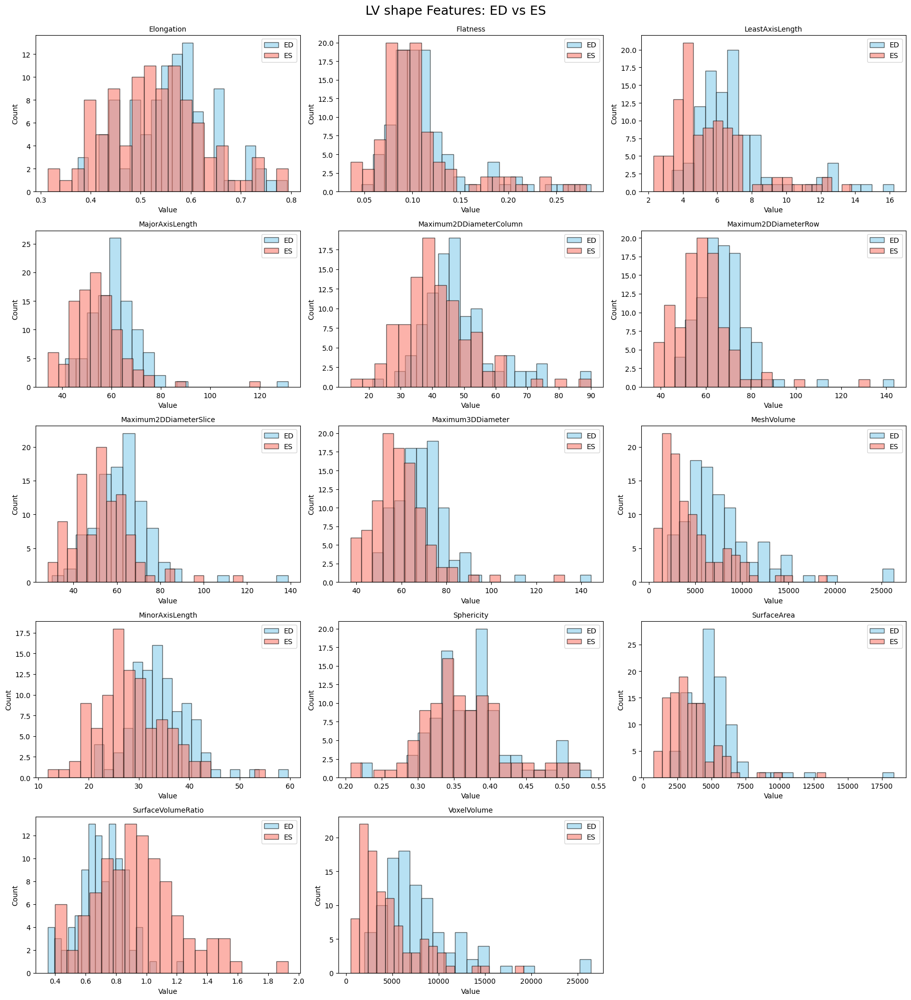

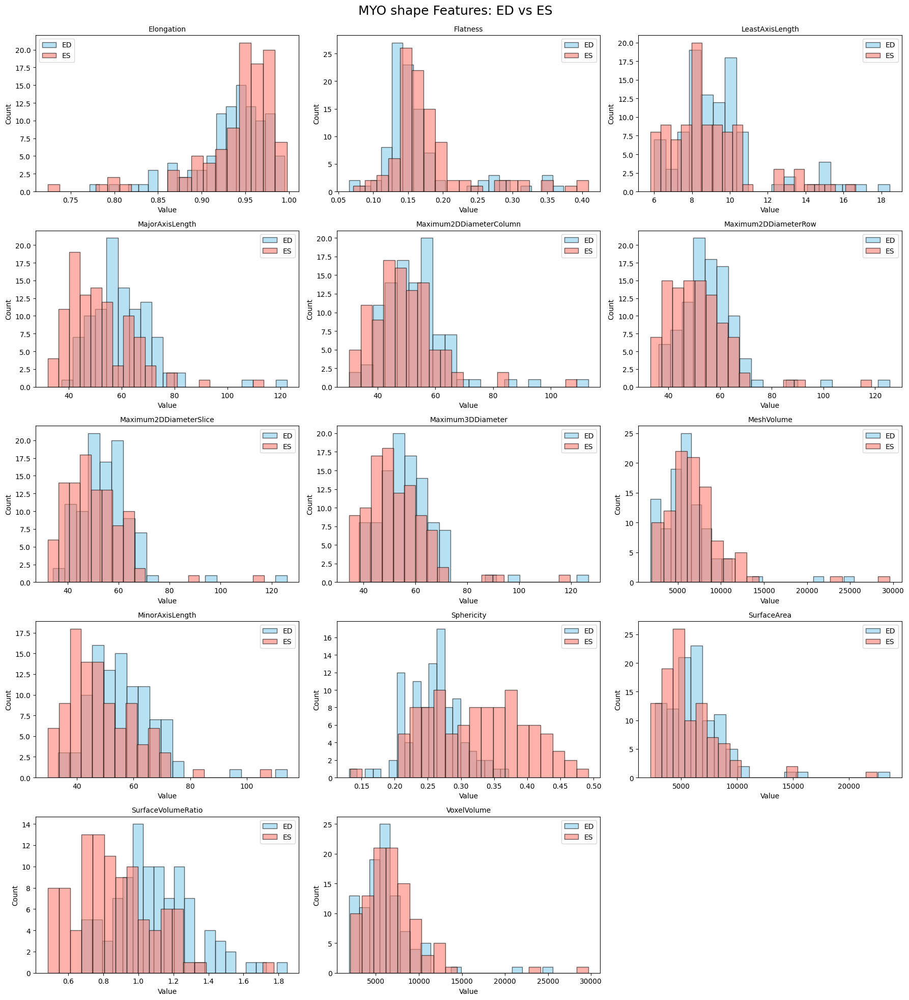

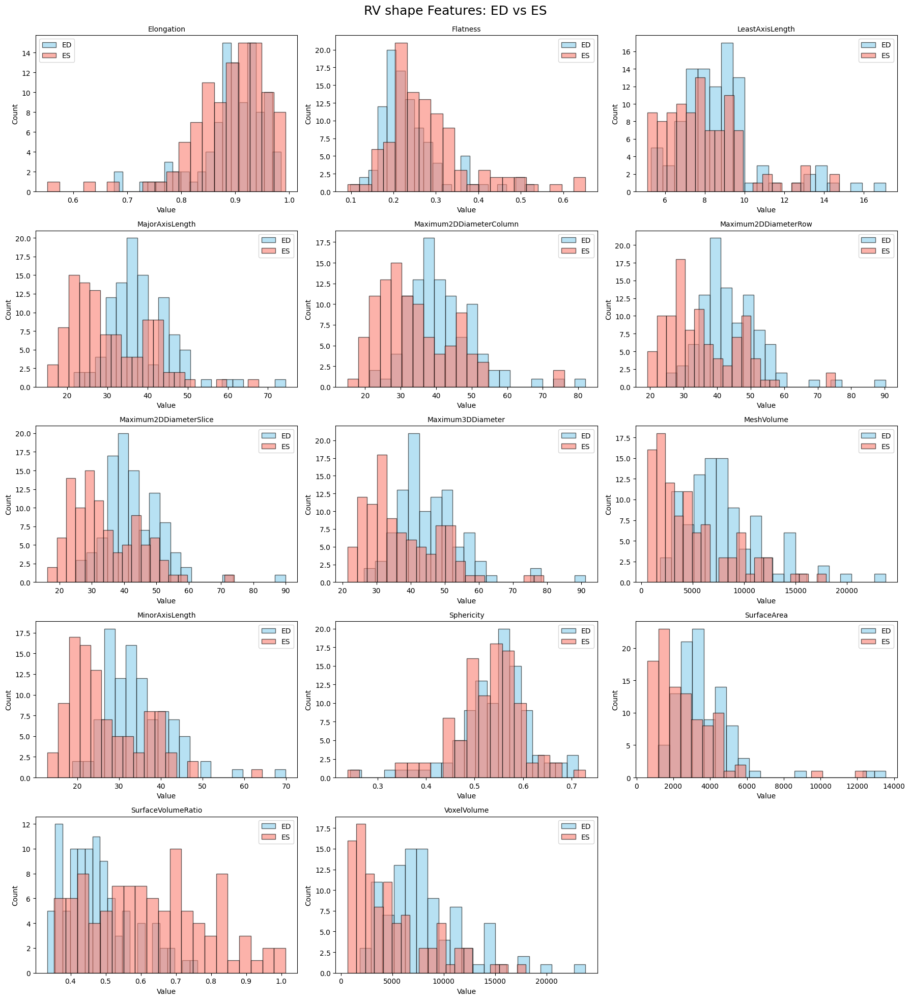

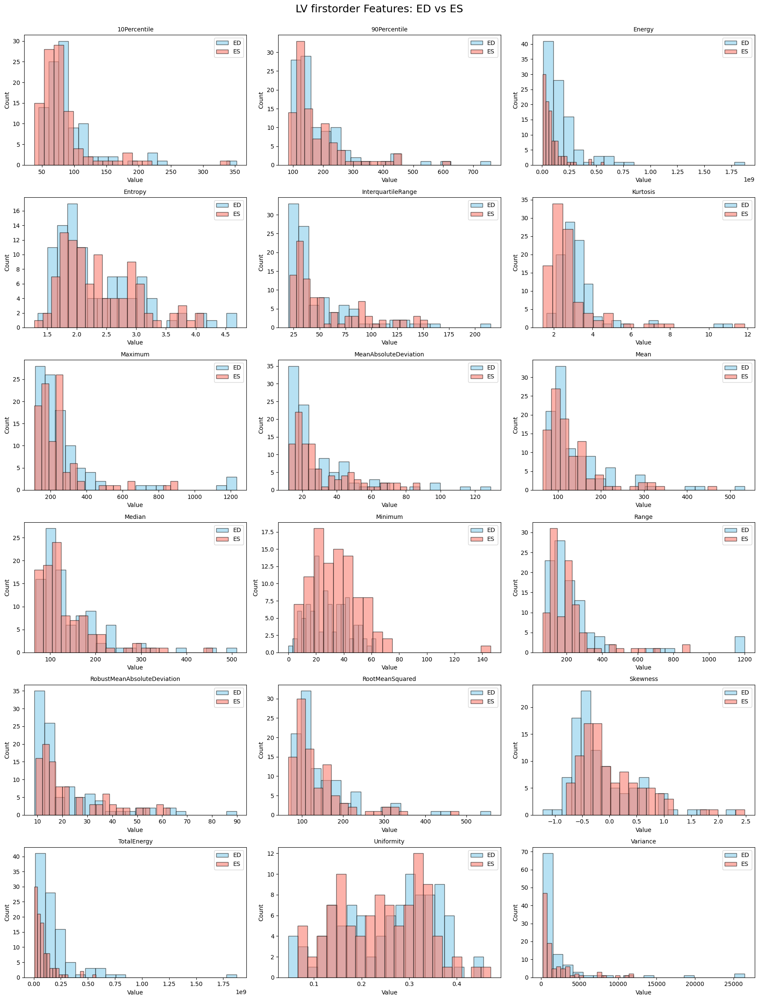

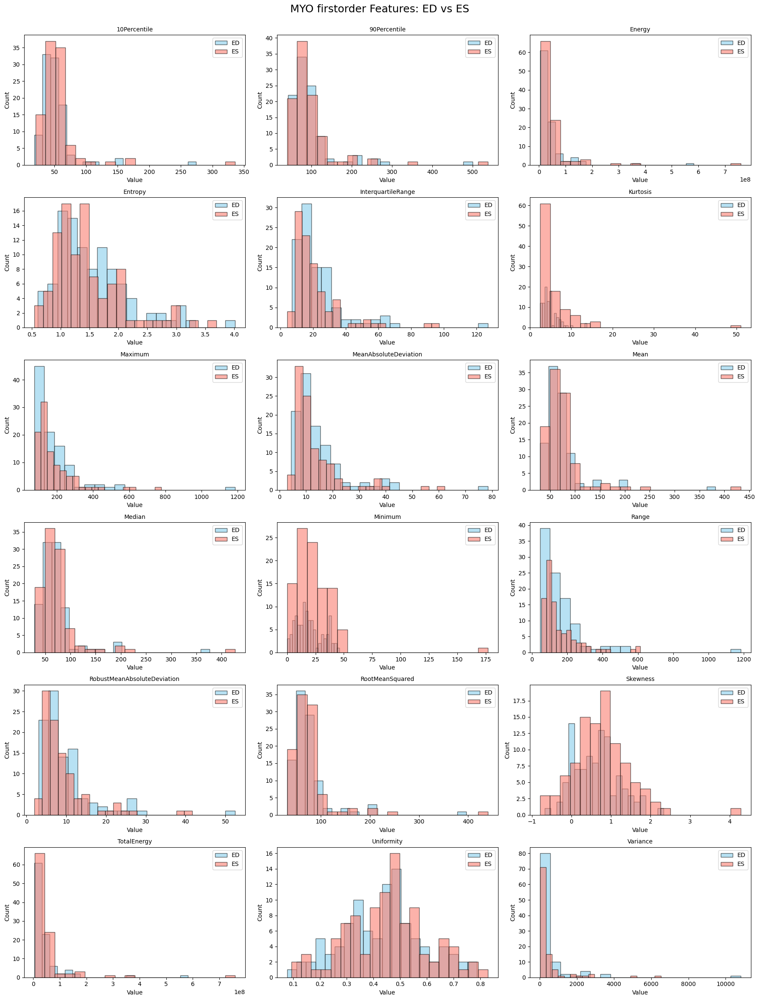

...

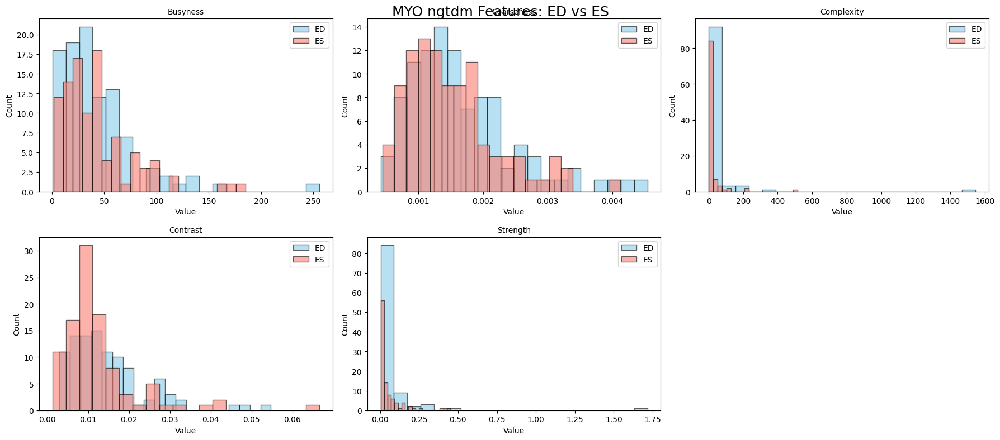

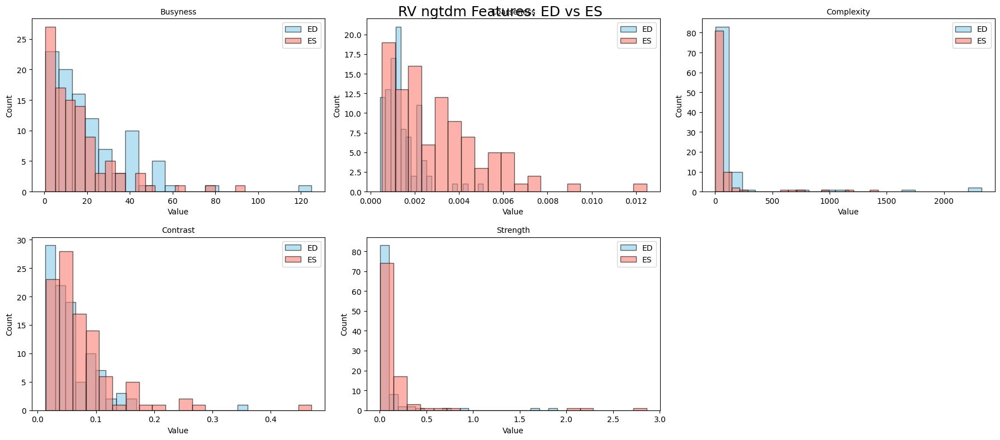

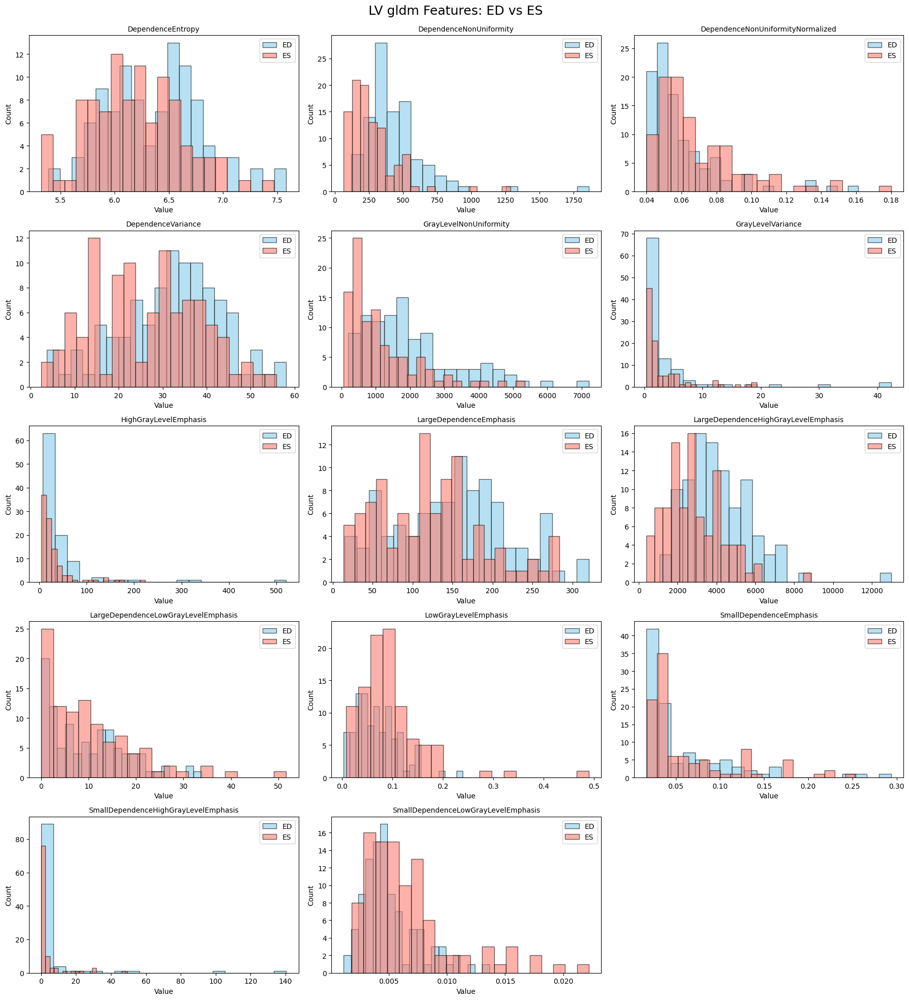

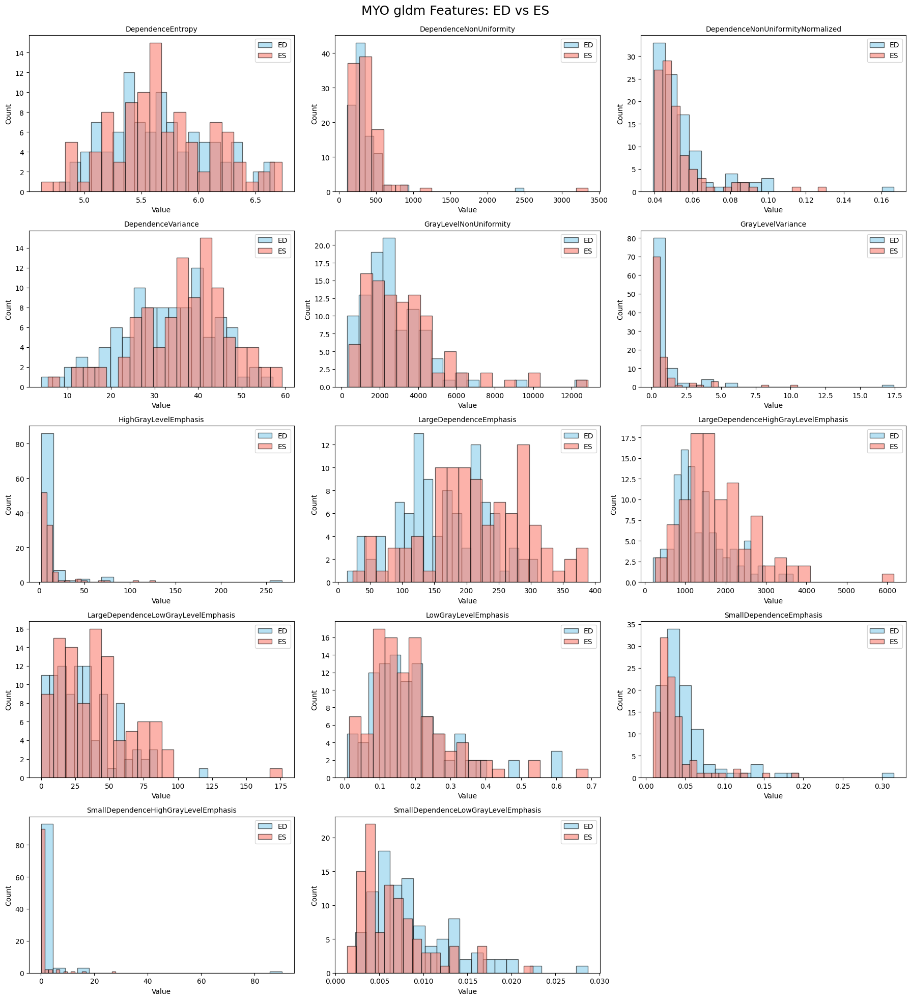

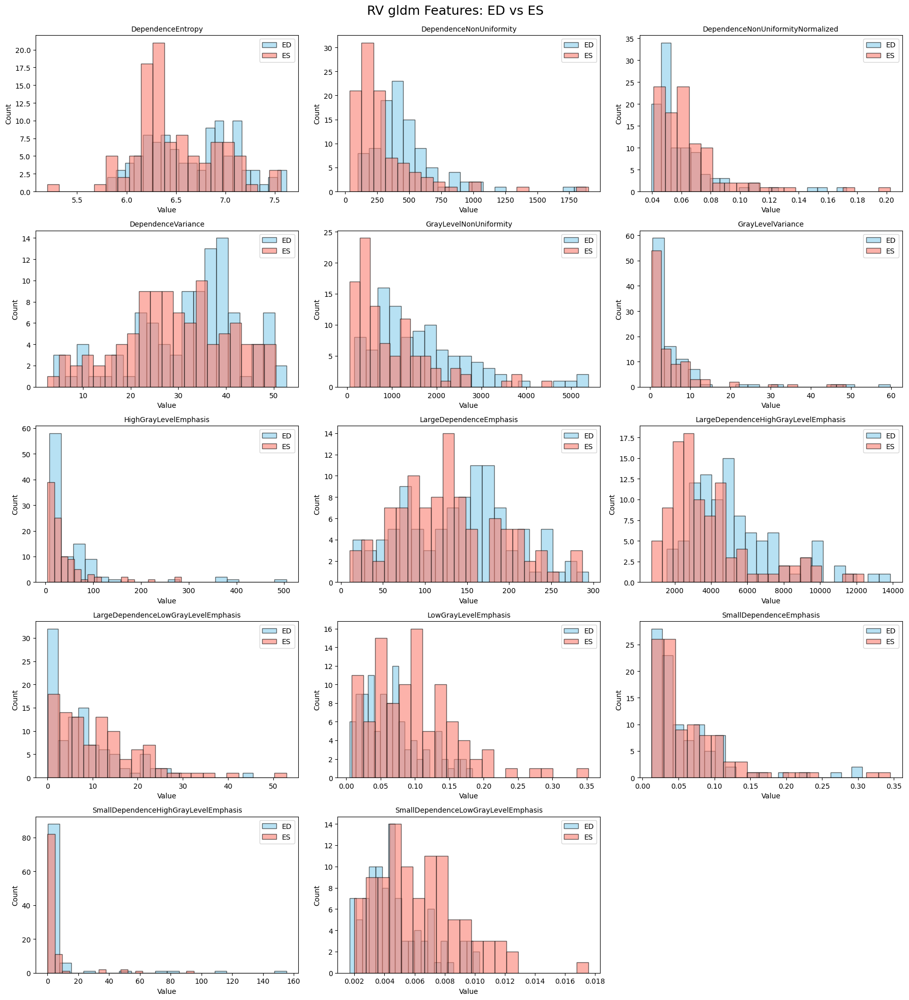

In [10]:
for feature in features:
    df = feature_dfs[feature]
    # Split shape features by structure and phase
    lv_ed = df[[col for col in df.columns if "_LV_ED" in col]]
    lv_es = df[[col for col in df.columns if "_LV_ES" in col]]
    myo_ed = df[[col for col in df.columns if "_MYO_ED" in col]]
    myo_es = df[[col for col in df.columns if "_MYO_ES" in col]]
    rv_ed = df[[col for col in df.columns if "_RV_ED" in col]]
    rv_es = df[[col for col in df.columns if "_RV_ES" in col]]

    compare_hists(lv_ed, lv_es, f"LV {feature} Features")
    compare_hists(myo_ed, myo_es, f"MYO {feature} Features")
    compare_hists(rv_ed, rv_es, f"RV {feature} Features")


We can also try applying PCA and plotting pairwise plots to see if any of the Principal Components is able to explainn the variance between the classes.

In [11]:
from sklearn.decomposition import PCA
def plot_pairwise_pca(df, title, n_components=4):
    # Extract features and labels
    features = df.drop(columns='class')
    labels = df['class']

    # Perform PCA
    pca = PCA(n_components=n_components)
    components = pca.fit_transform(features)

    # Create DataFrame with PCA components and class labels
    scatter_df = pd.DataFrame(data=components, columns=[f'PC{i+1}' for i in range(n_components)])
    scatter_df['class'] = labels.values

    # Plot pairplot
    sns.pairplot(scatter_df, hue='class', palette='Set2', diag_kind='kde')
    plt.suptitle(title, y=1.02)
    plt.show()

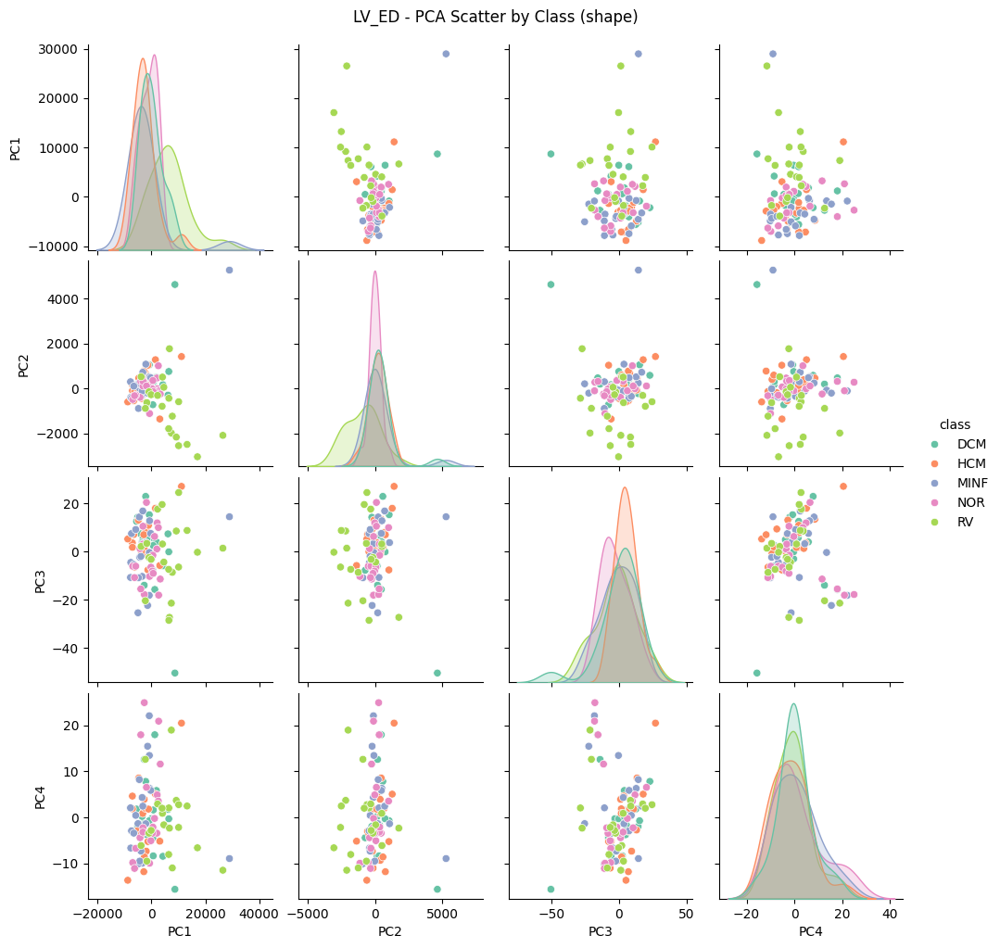

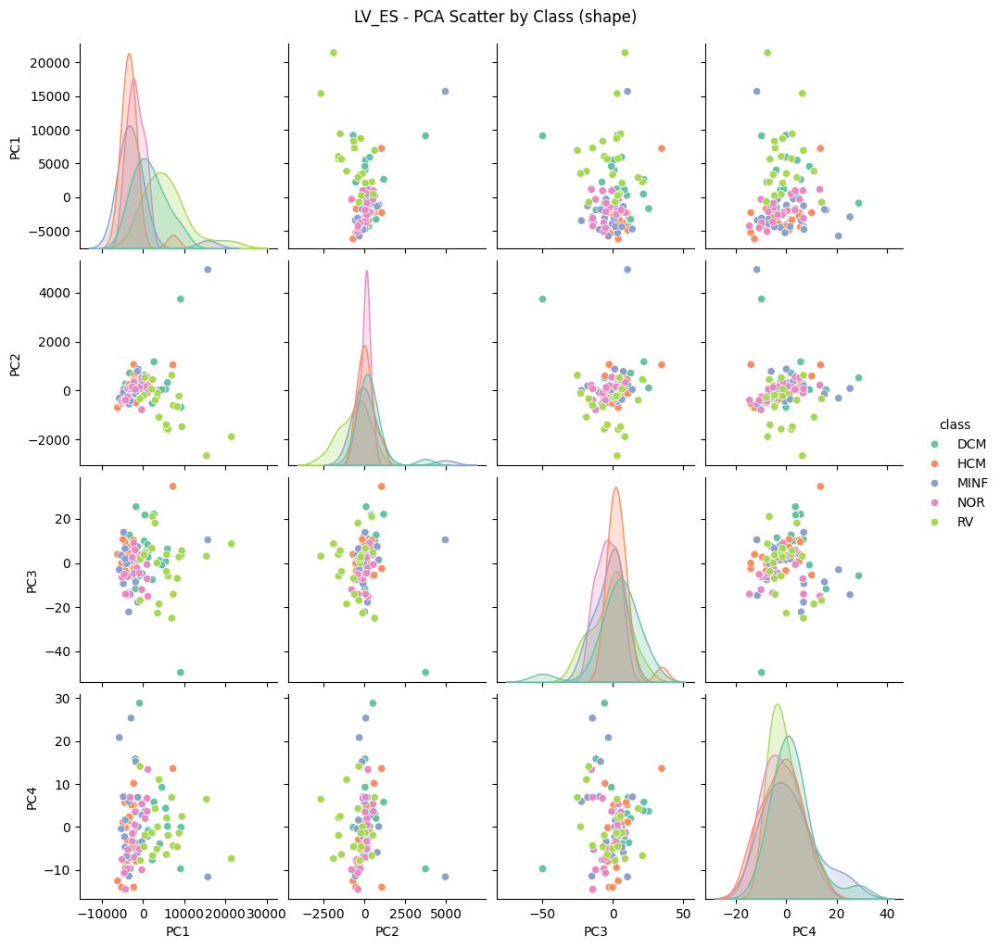

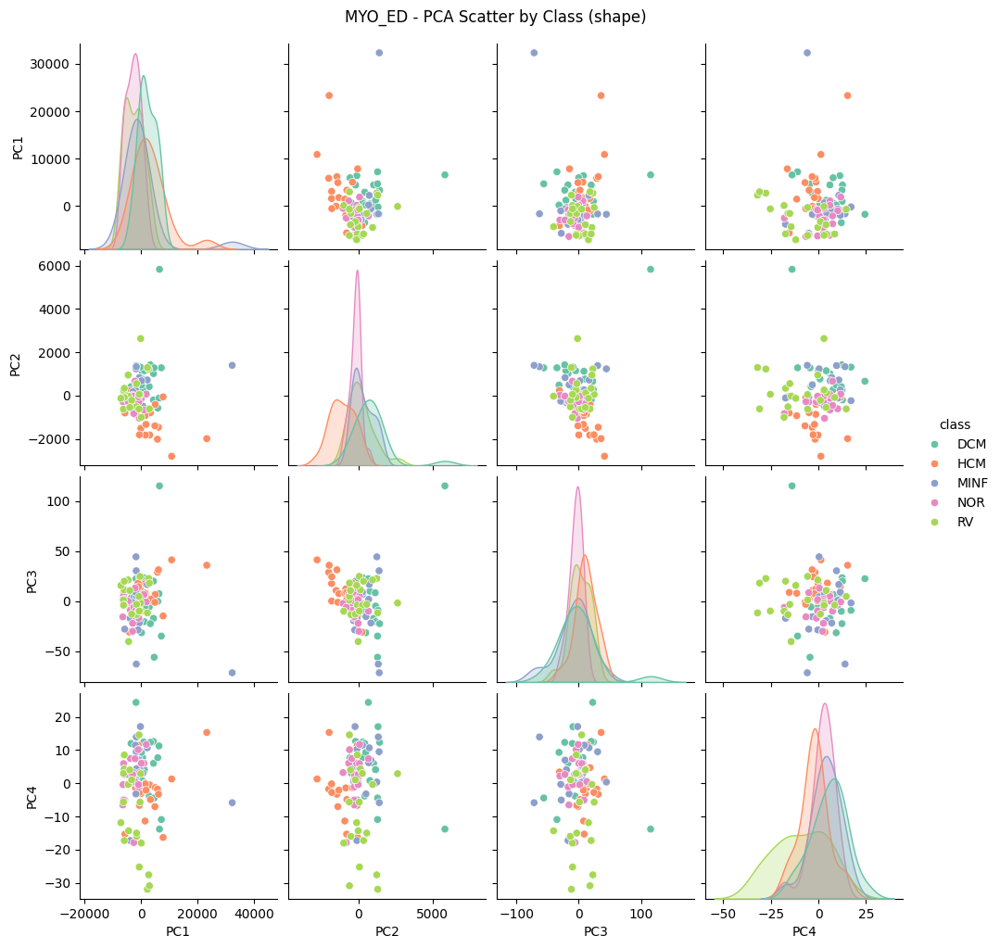

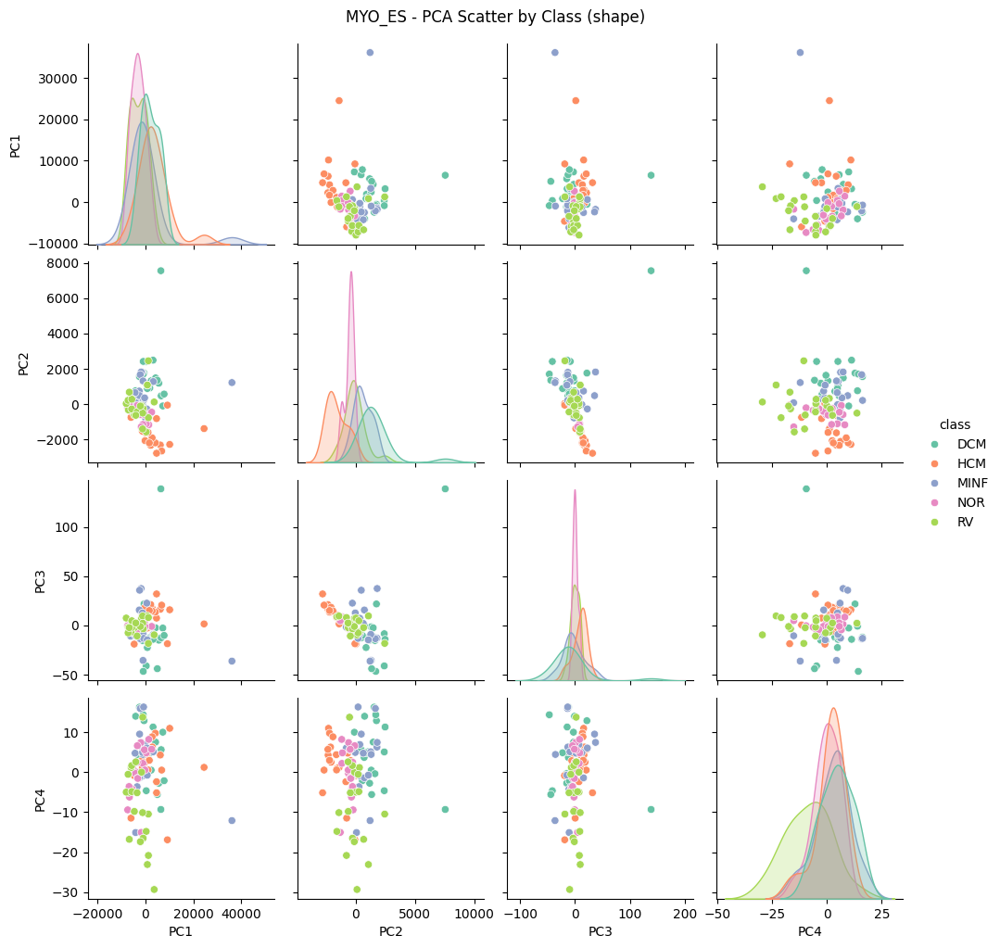

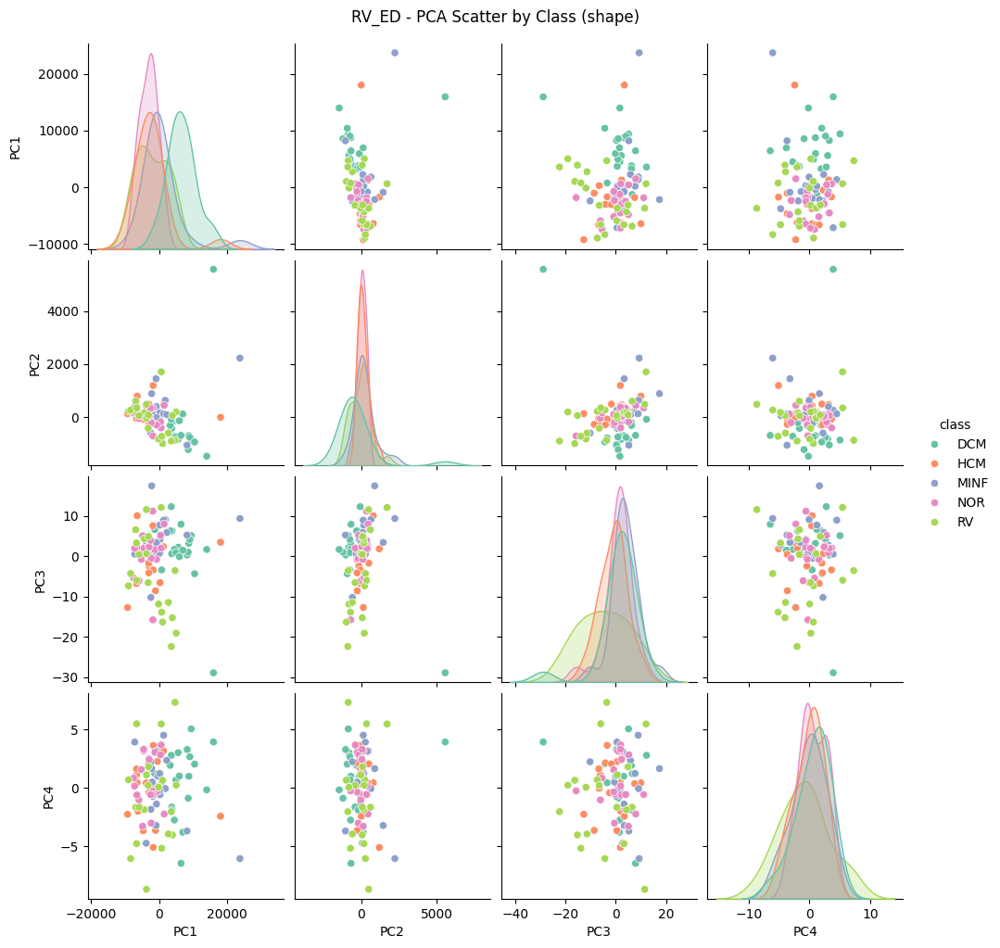

...

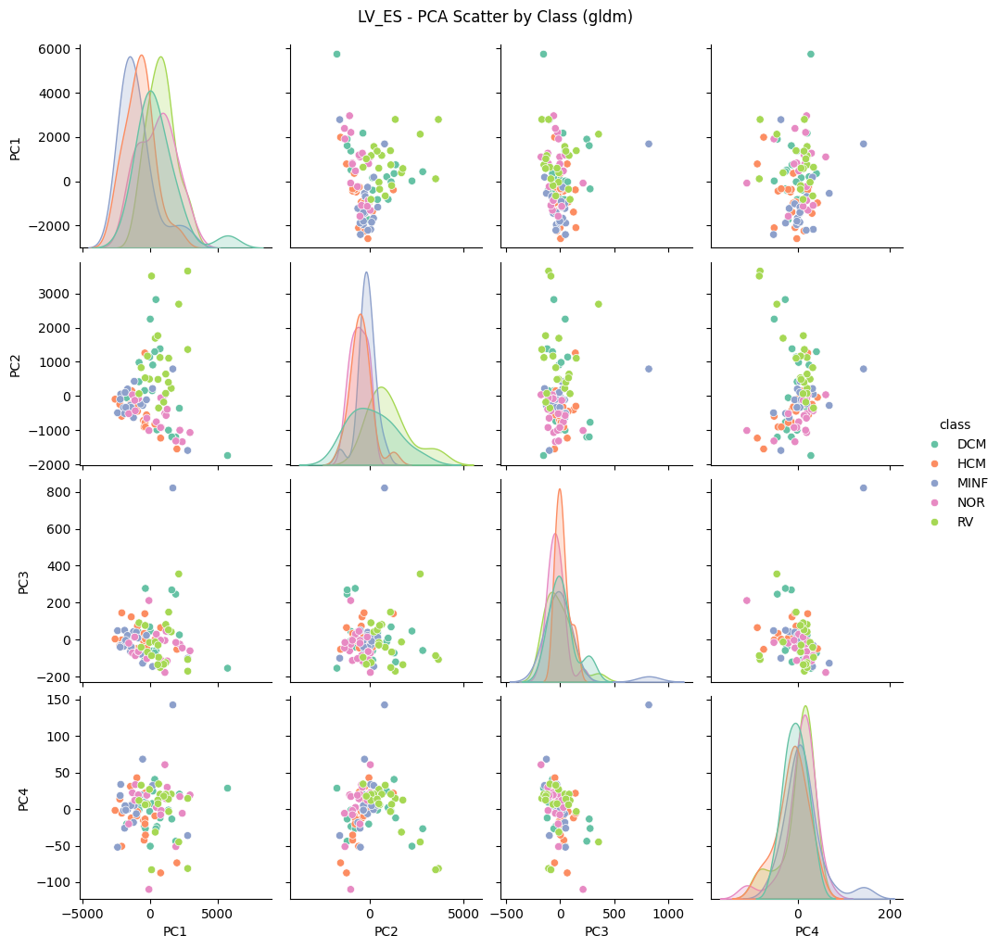

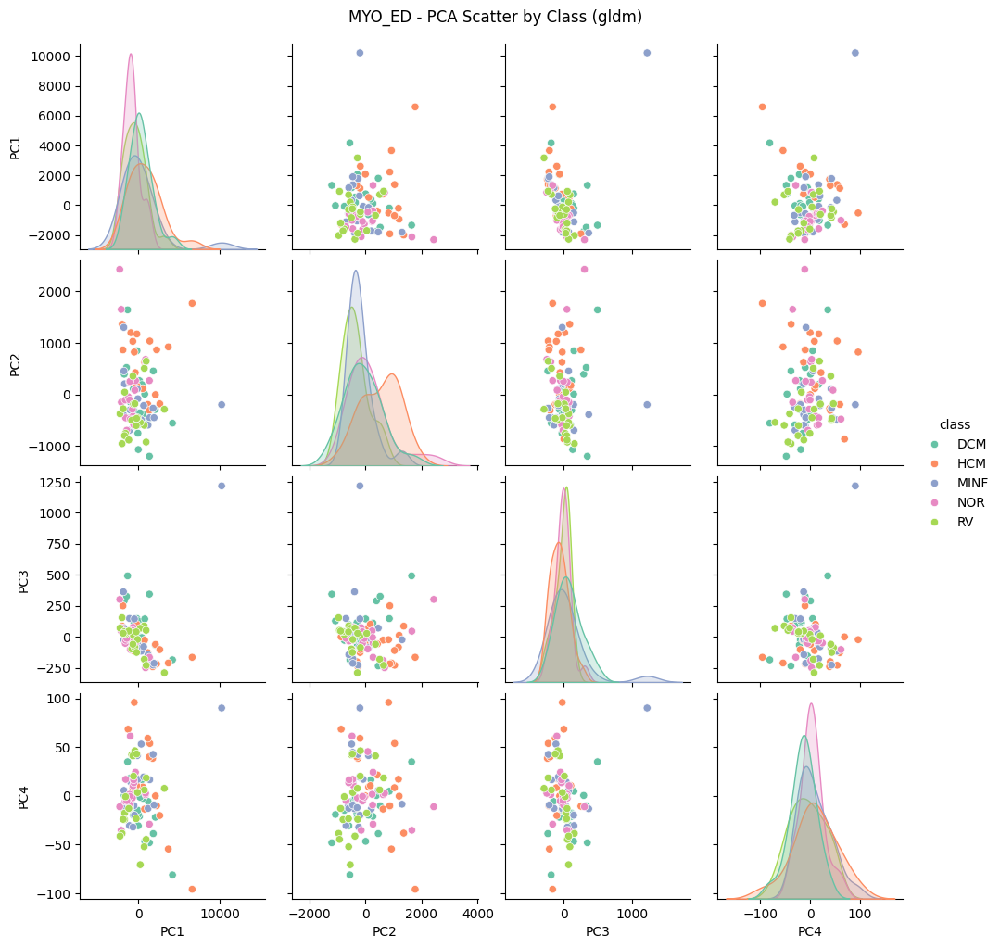

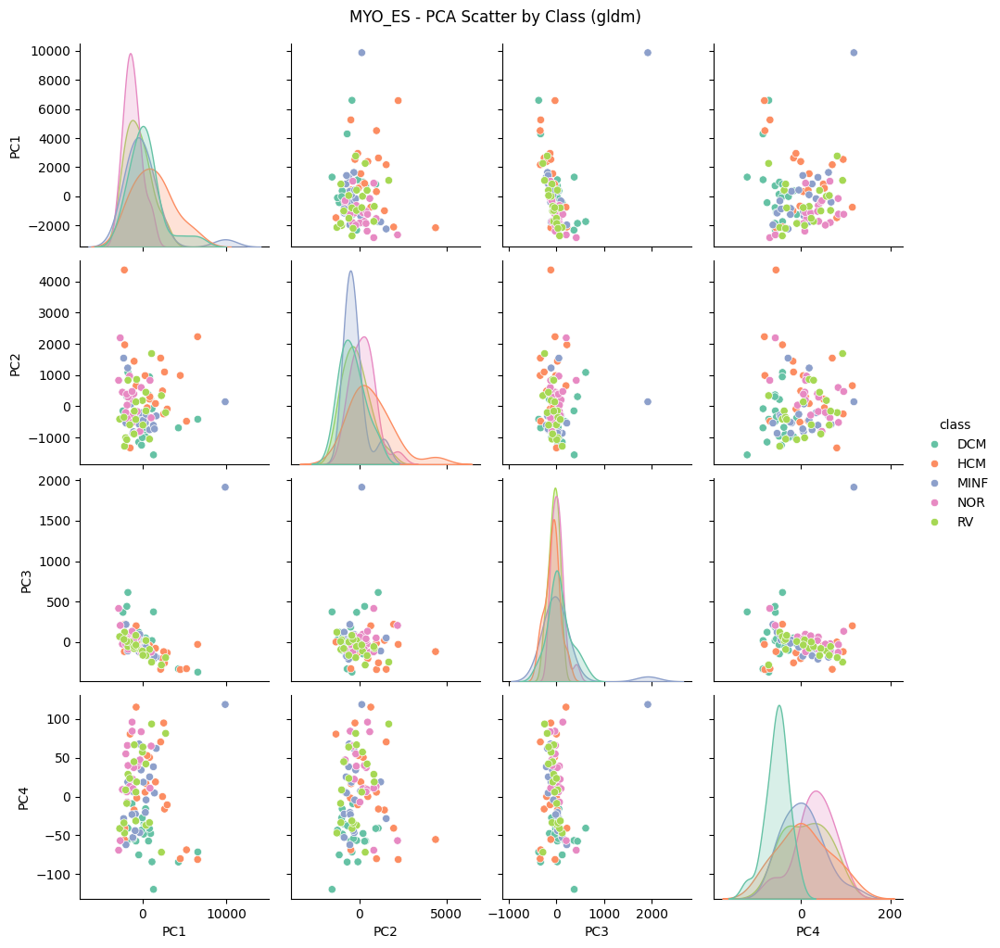

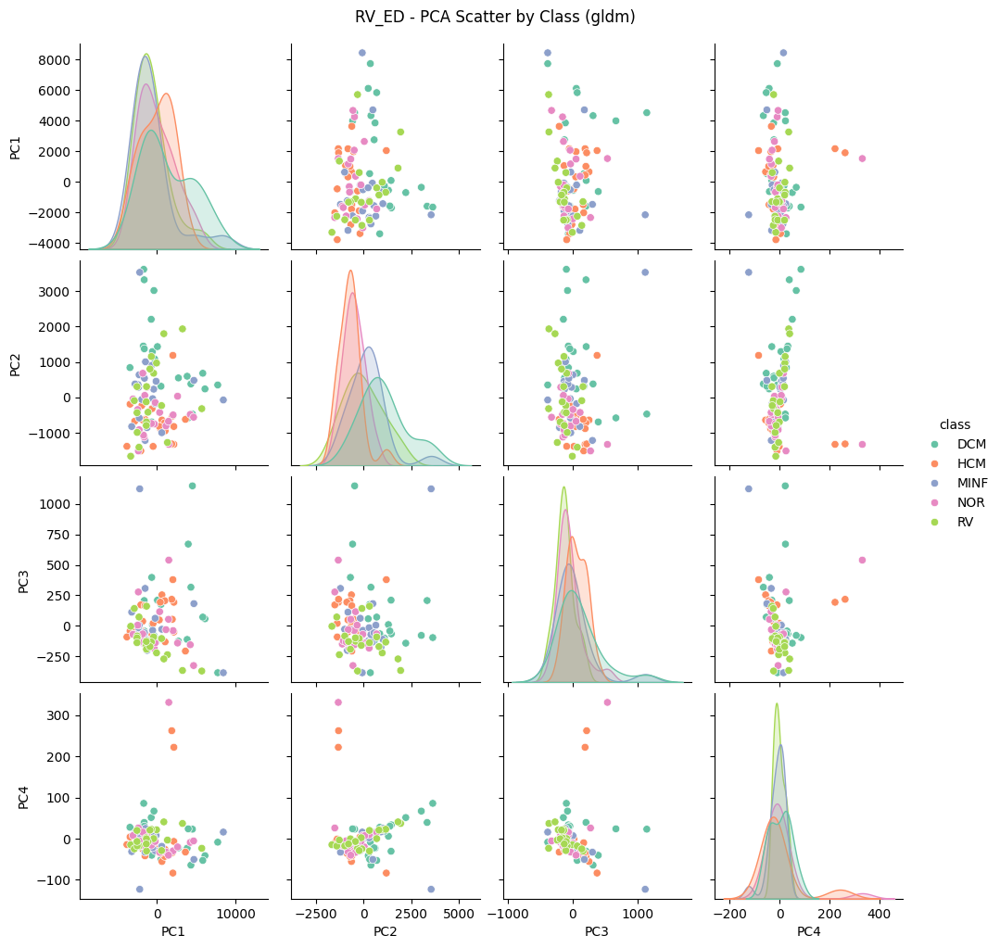

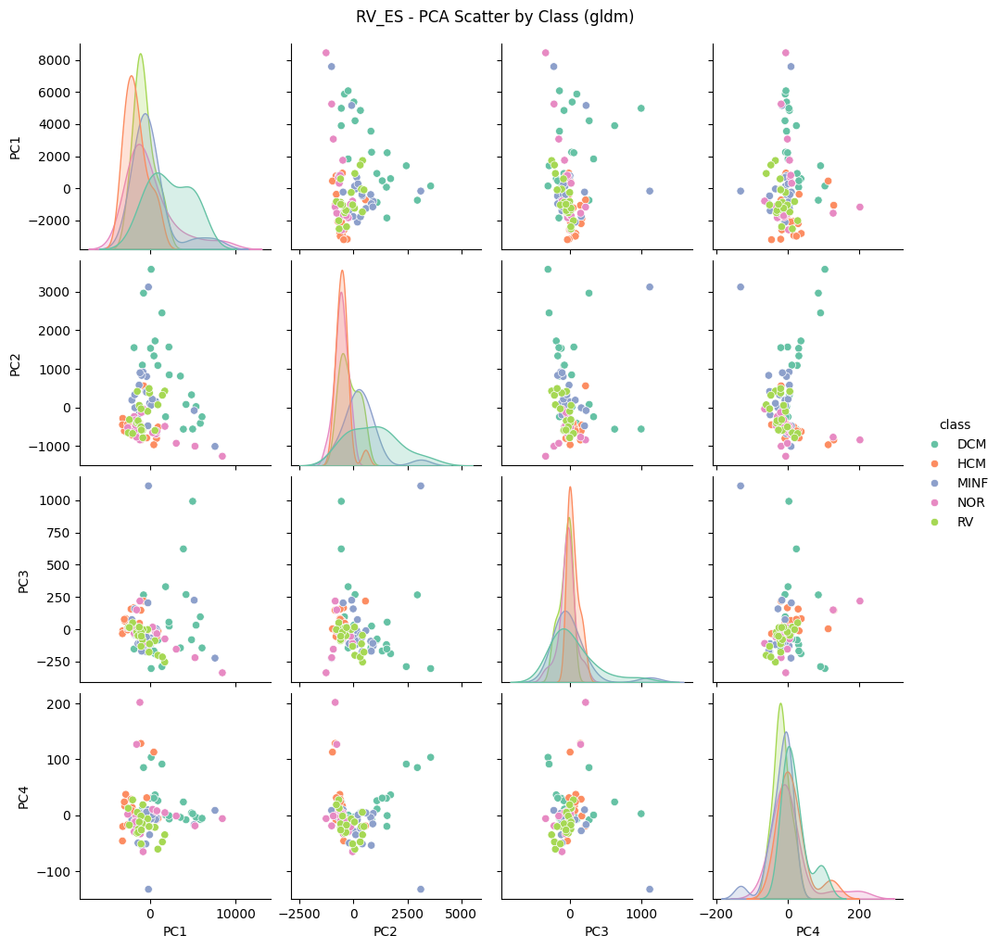

In [12]:
for feature in features:
    df = feature_dfs[feature]
    df = df.copy()
    # Split shape features by structure and phase
    lv_ed = df[[col for col in df.columns if "_LV_ED" in col]]
    lv_es = df[[col for col in df.columns if "_LV_ES" in col]]
    myo_ed = df[[col for col in df.columns if "_MYO_ED" in col]]
    myo_es = df[[col for col in df.columns if "_MYO_ES" in col]]
    rv_ed = df[[col for col in df.columns if "_RV_ED" in col]]
    rv_es = df[[col for col in df.columns if "_RV_ES" in col]]

    lv_ed = lv_ed.copy()
    lv_ed.loc[:, 'class'] = df_acdc.loc[lv_ed.index, 'class']
    lv_es = lv_es.copy()
    lv_es.loc[:, 'class'] = df_acdc.loc[lv_es.index, 'class']

    myo_ed = myo_ed.copy()
    myo_ed.loc[:, 'class'] = df_acdc.loc[myo_ed.index, 'class']
    myo_es = myo_es.copy()
    myo_es.loc[:, 'class'] = df_acdc.loc[myo_es.index, 'class']

    rv_ed = rv_ed.copy()
    rv_ed.loc[:, 'class'] = df_acdc.loc[rv_ed.index, 'class']
    rv_es = rv_es.copy()
    rv_es.loc[:, 'class'] = df_acdc.loc[rv_es.index, 'class']

    plot_pairwise_pca(lv_ed, f'LV_ED - PCA Scatter by Class ({feature})')
    plot_pairwise_pca(lv_es, f'LV_ES - PCA Scatter by Class ({feature})')
    plot_pairwise_pca(myo_ed, f'MYO_ED - PCA Scatter by Class ({feature})')
    plot_pairwise_pca(myo_es, f'MYO_ES - PCA Scatter by Class ({feature})')
    plot_pairwise_pca(rv_ed, f'RV_ED - PCA Scatter by Class ({feature})')
    plot_pairwise_pca(rv_es, f'RV_ES - PCA Scatter by Class ({feature})')

We can see that no single Principal Component is able to explain the variance so we will have to resort to other methods of dimensionality reduction such as LDA.
Finally we can try t-SNE to try to uncover some clustering that PCA is missing.

In [15]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

def plot_tsne(X, y, title):
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
    X_embedded = tsne.fit_transform(X)

    df_tsne = pd.DataFrame(X_embedded, columns=['TSNE1', 'TSNE2'])
    df_tsne['class'] = y.values

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='class', palette='tab10', alpha=0.7)
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

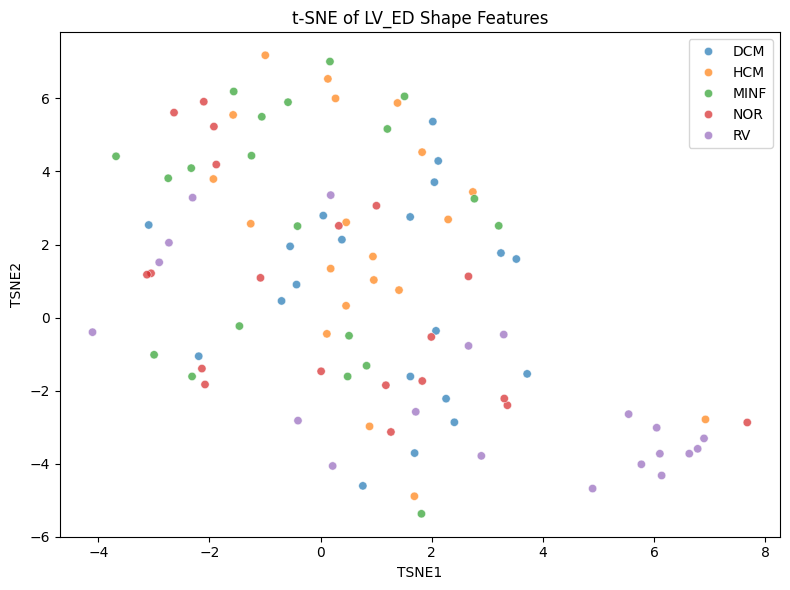

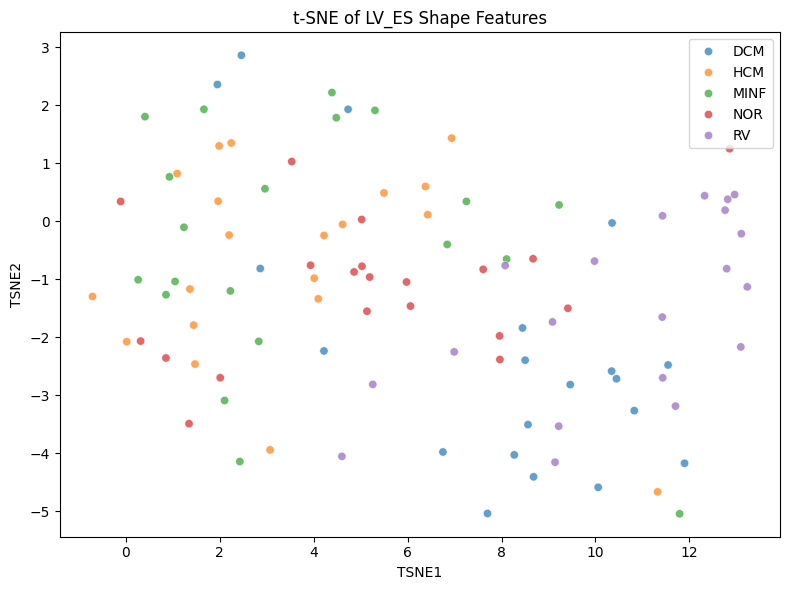

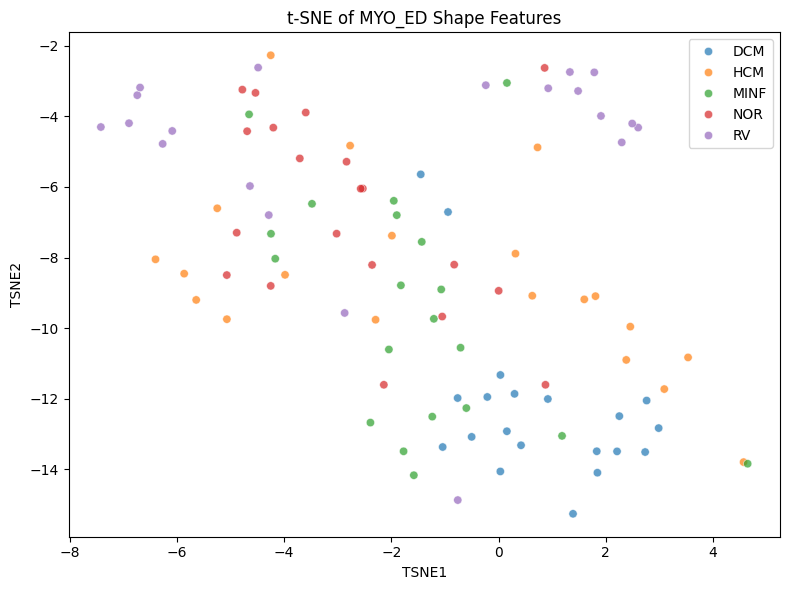

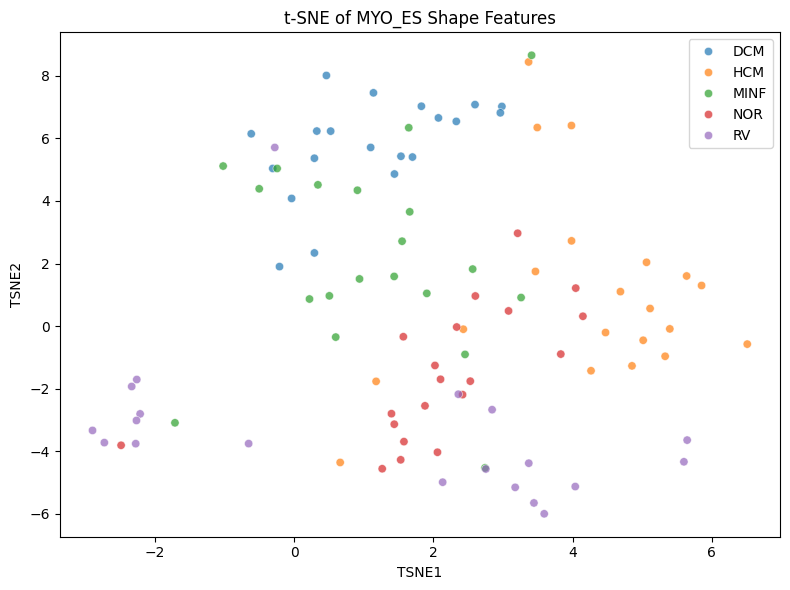

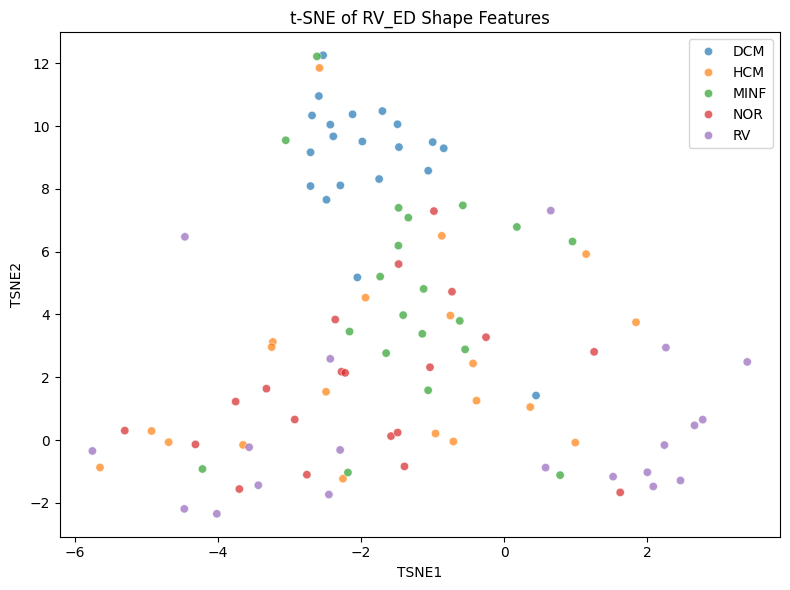

...

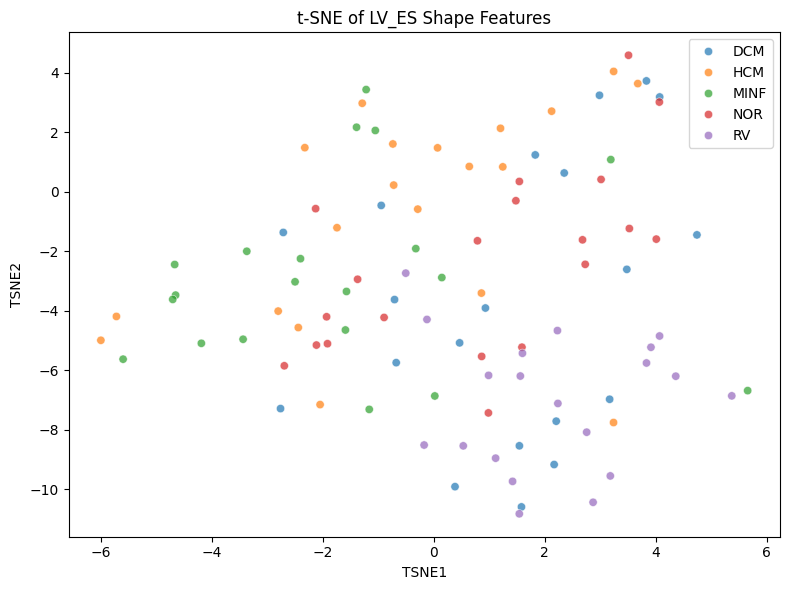

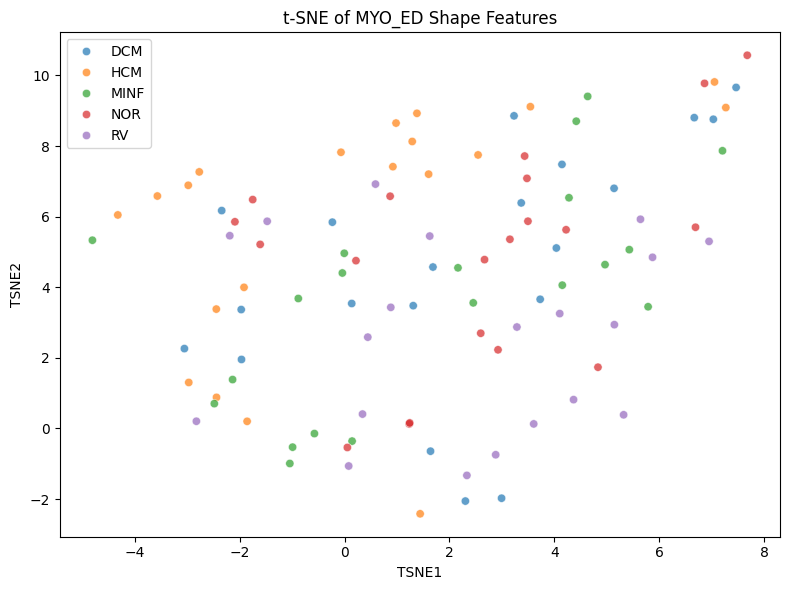

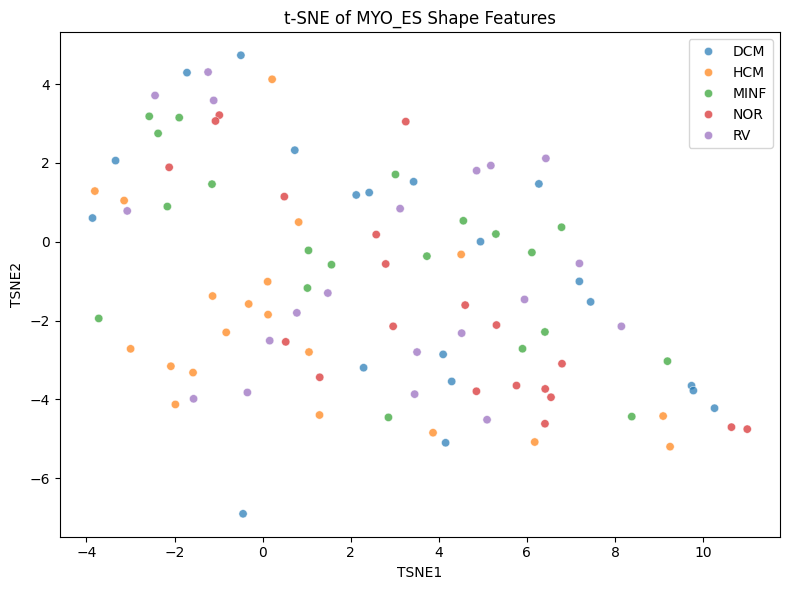

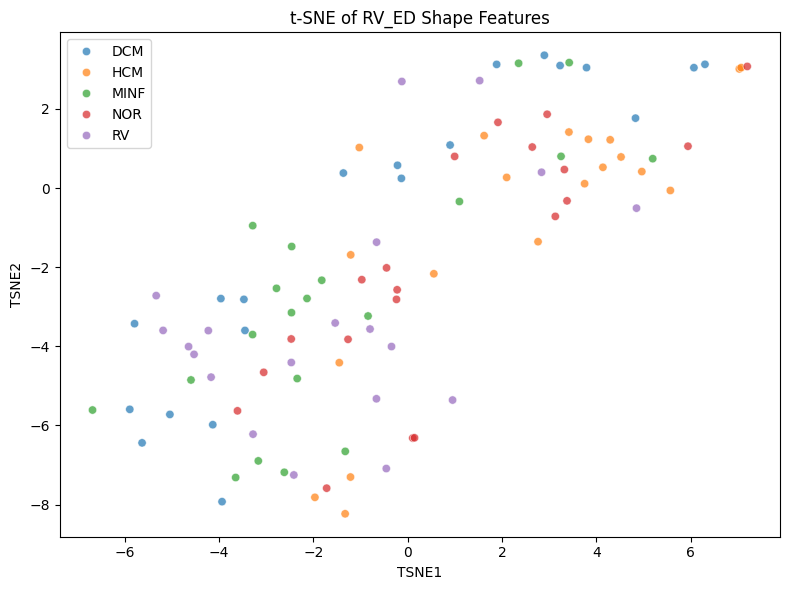

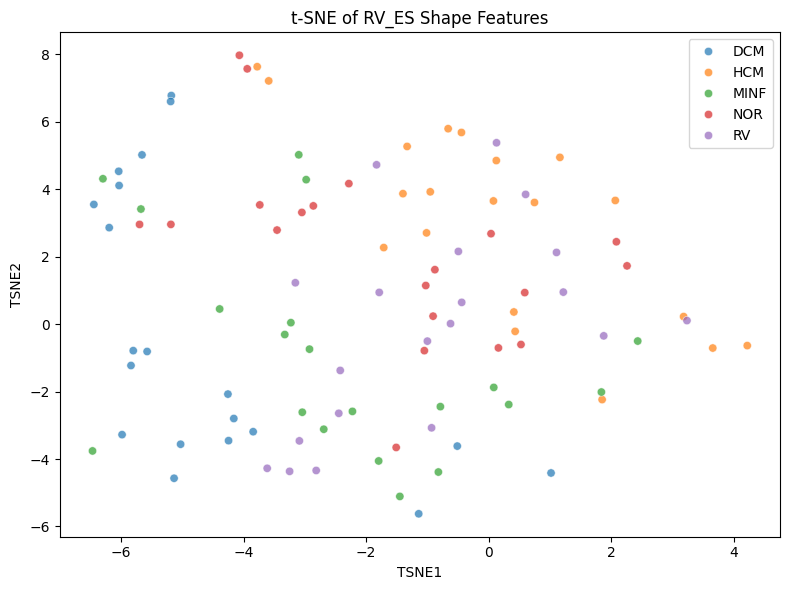

In [16]:
for feature in features:
    df = feature_dfs[feature]
    df = df.copy()
    # Split shape features by structure and phase
    lv_ed = df[[col for col in df.columns if "_LV_ED" in col]]
    lv_es = df[[col for col in df.columns if "_LV_ES" in col]]
    myo_ed = df[[col for col in df.columns if "_MYO_ED" in col]]
    myo_es = df[[col for col in df.columns if "_MYO_ES" in col]]
    rv_ed = df[[col for col in df.columns if "_RV_ED" in col]]
    rv_es = df[[col for col in df.columns if "_RV_ES" in col]]
    
    X = lv_ed.copy()
    X_scaled = StandardScaler().fit_transform(X)
    y = df_acdc.loc[lv_ed.index, 'class']
    plot_tsne(X_scaled, y, 't-SNE of LV_ED Shape Features')

    X = lv_es.copy()
    X_scaled = StandardScaler().fit_transform(X)
    y = df_acdc.loc[lv_es.index, 'class']
    plot_tsne(X_scaled, y, 't-SNE of LV_ES Shape Features')

    X = myo_ed.copy()
    X_scaled = StandardScaler().fit_transform(X)
    y = df_acdc.loc[myo_ed.index, 'class']
    plot_tsne(X_scaled, y, 't-SNE of MYO_ED Shape Features')

    X = myo_es.copy()
    X_scaled = StandardScaler().fit_transform(X)
    y = df_acdc.loc[myo_es.index, 'class']
    plot_tsne(X_scaled, y, 't-SNE of MYO_ES Shape Features')

    X = rv_ed.copy()
    X_scaled = StandardScaler().fit_transform(X)
    y = df_acdc.loc[rv_ed.index, 'class']
    plot_tsne(X_scaled, y, 't-SNE of RV_ED Shape Features')

    X = rv_es.copy()
    X_scaled = StandardScaler().fit_transform(X)
    y = df_acdc.loc[rv_es.index, 'class']
    plot_tsne(X_scaled, y, 't-SNE of RV_ES Shape Features')
